# Linear Backbone Geodesic Metric Test

Straightforward notebook for inspecting geodesic metrics for the pure linear `LatentAttnMasked` backbone.

Here that behavior is built directly into the model class: setting `residual_mode="none"` means the model uses only the learned linear latent backbone and does not activate the attention residual branch.

## Math Summary

With `residual_mode="none"`, `LatentAttnMasked` reduces to a pure linear backbone in PCA latent space.

Let the source SC edge vector be $x_s \in \mathbb{R}^{d_s}$ and the target FC edge vector be $y_t \in \mathbb{R}^{d_t}$.
Using the train-split PCA summaries stored in the dataset object, the model encodes SC into latent coordinates by

$$
c_s = (x_s - \mu_s) U_s,
$$

where $\mu_s$ is the train mean SC vector and $U_s \in \mathbb{R}^{d_s \times k}$ is the retained SC PCA loading matrix.

In this notebook there is no attention residual branch, so the latent prediction is just the learned affine map

$$
\hat c_t = W c_s + b.
$$

Equivalently, the notebook is testing a learned linear SC to FC map inside the truncated PCA coordinate system.

The final FC edge prediction is then decoded through the fixed target PCA basis:

$$
\hat y = U_t \hat c_t + \mu_t.
$$

So the full map being evaluated is

$$
\hat y = U_t(W(x_s-\mu_s)U_s + b) + \mu_t.
$$

This keeps the model class the same as the attention experiments, but removes the masked-token correction term entirely.

The training loss in this notebook is still `balanced_composite`, so optimization happens in edge space even though the model parameterization is linear in latent space:

$$
\mathcal{L} = \alpha_{\mathrm{mse}} \mathcal{L}_{\mathrm{mse}} + \alpha_{\mathrm{correye}} \mathcal{L}_{\mathrm{correye}} + \alpha_{\mathrm{neidist}} \mathcal{L}_{\mathrm{neidist}},
$$

with the notebook relying on the implementation's automatic balancing of those component scales.

In [1]:
import importlib
from pathlib import Path

import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import display

import main
import models.config
import models.eval
import models.lightning_module
import models.loss
import models.latent_attn_masked

importlib.reload(models.loss)
importlib.reload(models.lightning_module)
importlib.reload(models.latent_attn_masked)
importlib.reload(models.eval)
importlib.reload(models.config)
importlib.reload(main)

from main import Sim

RESULTS_ROOT = Path('results/local_results')
RESULTS_ROOT.mkdir(parents=True, exist_ok=True)


### Define and train model

In [2]:
config_override = {
    "model": {
        "n_components_pca": 128,
        "residual_mode": "none",
        "residual_gain_init": 0.0,
        "reg": 1e-7,
    },
    "trainer": {
        "max_epochs": 100,
        "batch_size": 128,
        "lr": 1e-4,
        "loss_type": "balanced_composite",
        "loss_terms": ["mse", "correye", "neidist"],
        "loss_scale_ema_decay": 0.95,
        "loss_scale_warmup_steps": 20,
    },
}

sim = Sim(
    model_name="LatentAttnMasked",
    config_overrides=config_override,
    source="SC",
    target="FC",
    parcellation="Glasser",
    shuffle_seed=0,
    data_load_mode="precomputed",
)


/ext3/miniforge3/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3065: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/ext3/miniforge3/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3066: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


LatentAttnMasked init | src=SC tgt=FC | k=256 pls=16 | token_embedding_type=learned token_embedding_dim=16 | residual_mode=none residual_gain_init=0.0 | attn_dim=16 value_dim=16 | transformer_layers=0 num_heads=1 | readout_type=concat_mlp readout_hidden_dims=[16] | attention_activation=softmax | zscore_pca_scores=False | mask_ratio=0.5 visible_fc_context=True | sc_token_dropout=0.0


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
/ext3/miniforge3/lib/python3.12/site-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/asr655/.local/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=4` in the `DataLoader` to improve performance.
/home/asr655/.local/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=4` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.



Training complete!


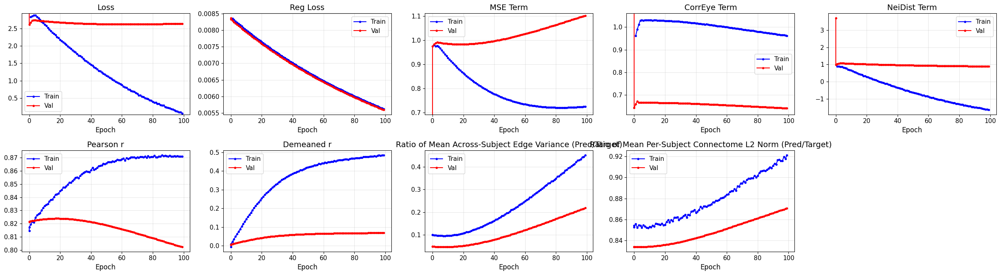

Number of unique demographic categories: 14


/scratch/asr655/neuroinformatics/Conn2Conn/models/eval.py:887: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Top-1 accuracy: 0.103  (20 of 195 subjects had rank 1) (chance=0.005)
Average rank percentile: 0.846 (chance=0.5)


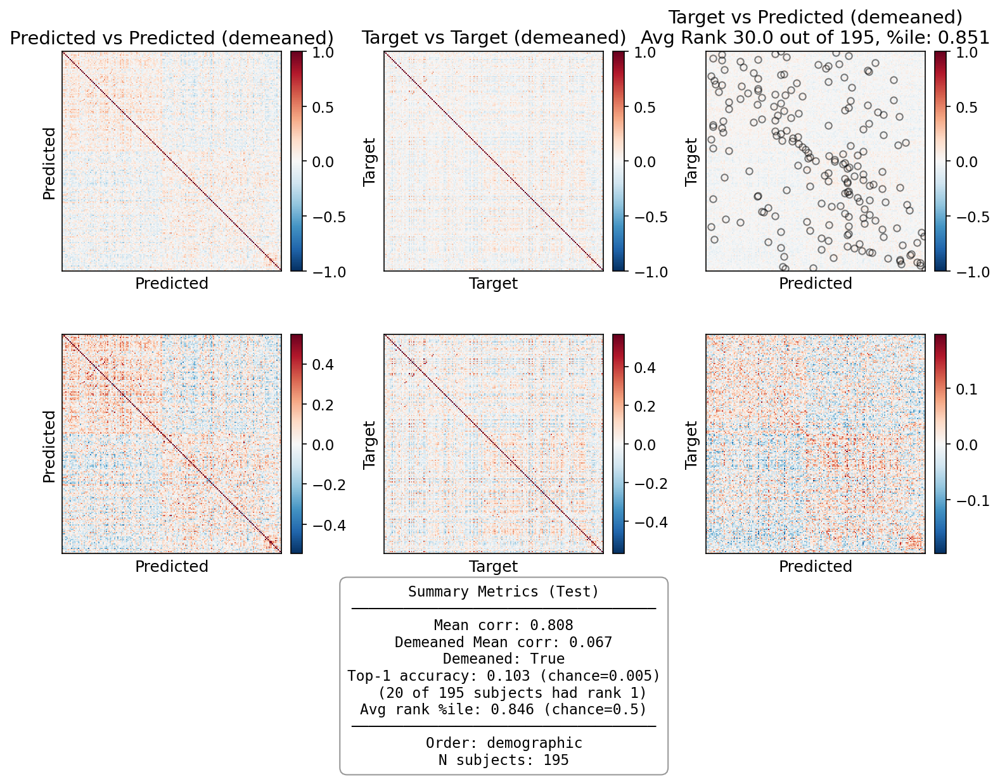

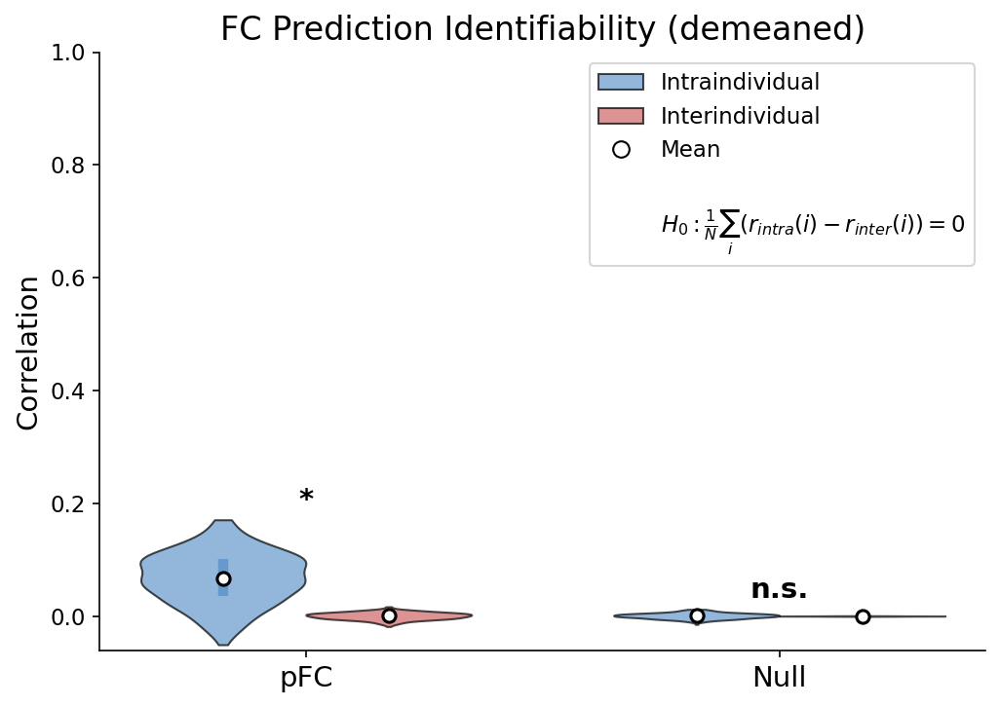


Identifiability Summary:
Condition    r_intra    r_inter    d          t          p            Cohen d   
----------------------------------------------------------------------
pFC          0.0675     0.0002     0.0673     20.41      3.38e-50     1.46      
Null         0.0004     -0.0001    0.0005     1.35       1.78e-01     0.10      


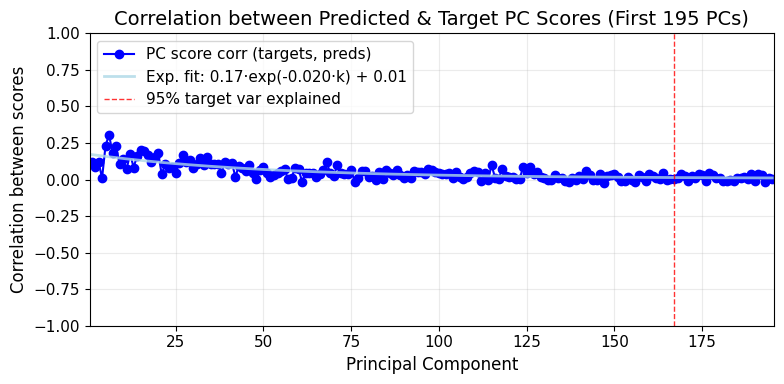

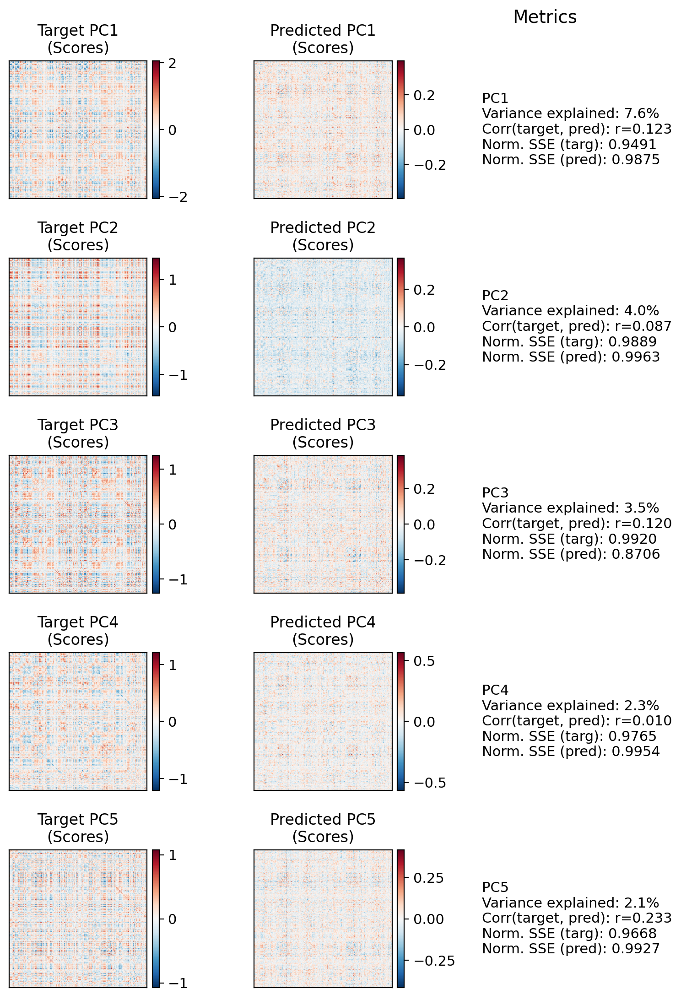

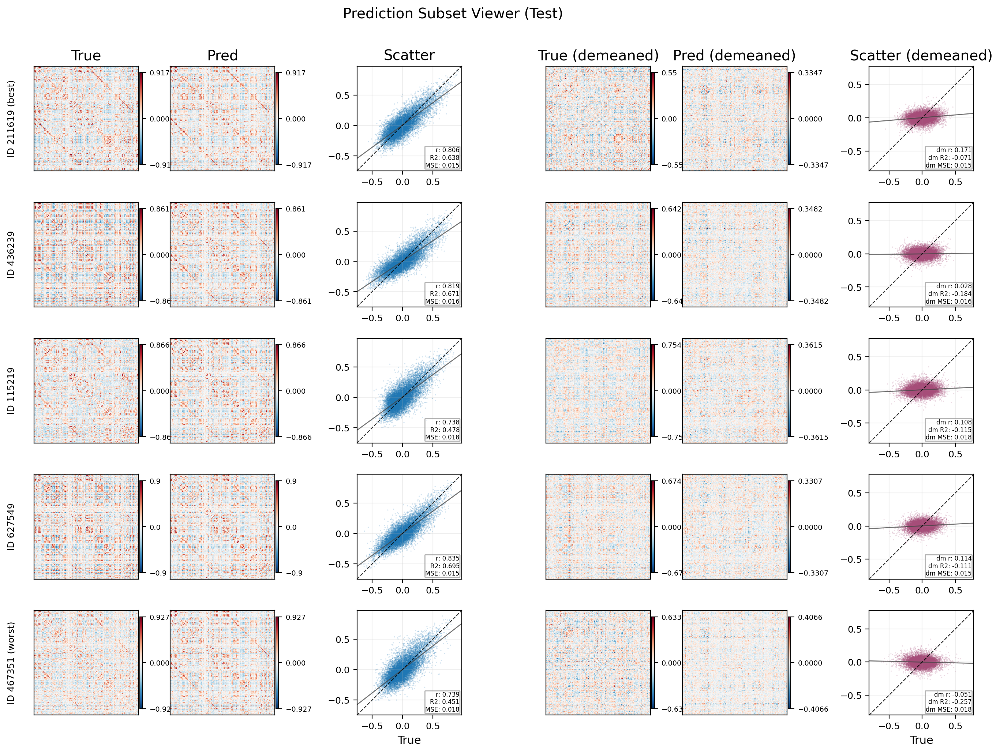

attention residual active: False


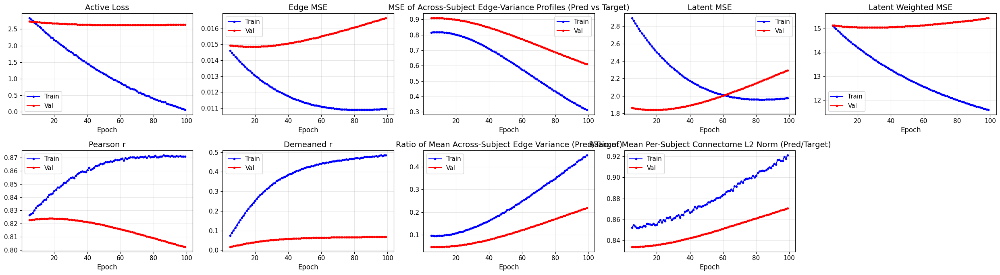

In [3]:
config_override = {
    "model": {
        "n_components_pca": 256,
        "residual_mode": "none",
        "residual_gain_init": 0.0,
        "reg": 1e-6,
    },
    "trainer": {
        "max_epochs": 100,
        "batch_size": 128,
        "lr": 5e-4,
        "loss_type": "balanced_composite",
        "loss_terms": ["mse", "correye", "neidist"],
        "loss_scale_ema_decay": 0.95,
        "loss_scale_warmup_steps": 20,
    },
}

run_out = sim._run_learned_single(
    mode="dev",
    save_checkpoint=False,
    config_override=config_override,
    run_eval=True,
)

model_trained = run_out["model"]
model_trained.eval()
print("attention residual active:", model_trained.use_attention_residual)
run_out["test_metrics"]["base_metrics"]
run_out["train_result"].plot(style="latent", skip_first_n_epochs=5)

### Evaluate identifiability using Geodesic distance measures

## Geodesic Metric Idea

After predicting FC upper-triangle edges, the notebook reconstructs each subject's full FC matrix $\hat Y_i$ and compares it with the target matrix $Y_i$.

If $v_i$ is the vectorized upper triangle for subject $i$, reconstruction just fills the symmetric matrix with a fixed diagonal value:

$$
Y_i = \mathrm{tri2square}(v_i; \mathrm{diag}=1).
$$

For the SPD-based metrics, each reconstructed matrix is first symmetrized and then projected to the SPD cone. If

$$
Y_i^{sym} = \tfrac{1}{2}(Y_i + Y_i^\top) = Q \Lambda Q^\top,
$$

the notebook replaces the eigenvalues by a floored version

$$
\Lambda^+ = \mathrm{diag}(\max(\lambda_1, \varepsilon), \dots, \max(\lambda_r, \varepsilon))
$$

and uses

$$
Y_i^{spd} = Q \Lambda^+ Q^\top.
$$

This is why the notebook also reports projection metadata such as clipped-eigenvalue fraction and clip mass.

The main quantity is the target-prediction distance matrix

$$
D_{ij} = d(Y_i, \hat Y_j),
$$

where $d$ is one of the distances implemented in `models/FC_distance.py`.
For this notebook, `affine_invariant` is the choice most faithful to the cited geometry-aware FC paper, while `log_euclidean` is mainly a faster SPD-aware alternative.

For the log-Euclidean metric,

$$
d_{LE}(A, B) = \|\log(A) - \log(B)\|_F.
$$

For the affine-invariant Riemannian metric,

$$
d_{AI}(A, B) = \left(\sum_{m=1}^r \log^2 \lambda_m\left(A^{-1/2}BA^{-1/2}\right)\right)^{1/2}.
$$

For the Frobenius baseline, the notebook skips SPD projection and uses

$$
d_F(A, B) = \|A-B\|_F.
$$

The diagonal entries $D_{ii}$ are self-match distances. The identifiability summaries are then simple nearest-neighbor diagnostics in this distance matrix.

Top-1 accuracy is

$$
\mathrm{Top1} = \frac{1}{n}\sum_{i=1}^n \mathbf{1}\{\arg\min_j D_{ij} = i\},
$$

and the average-rank percentile is computed from the rank of the diagonal entry within each row, so higher is better and a perfect self-match pattern gives a value near $1$.

So these geodesic plots are asking: once the linear latent predictions are decoded back into full FC matrices, are subjects still closest to their own targets under an SPD-aware notion of matrix similarity?

In [4]:
import importlib
import models.FC_distance
from models.FC_distance import *
import models.eval

importlib.reload(models.FC_distance)
importlib.reload(models.eval)
from models.FC_distance import *


Number of unique demographic categories: 14


/scratch/asr655/neuroinformatics/Conn2Conn/models/eval.py:538: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


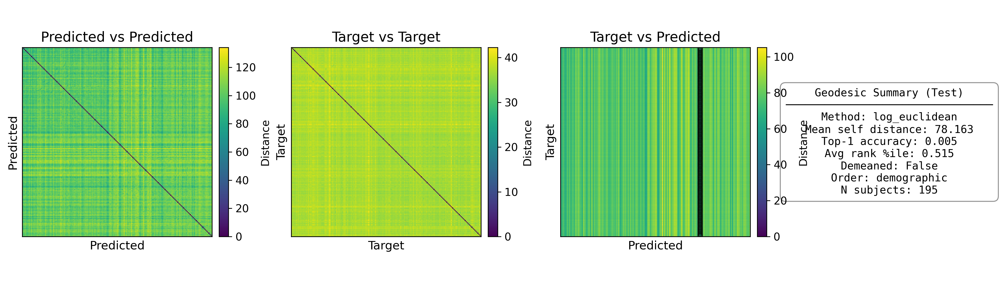


Geodesic FC distance metadata:
Partition: Test
Method: log_euclidean
Demeaned: False
Order: demographic
Color scale mode: per_plot
Diagonal value: 1.000
SPD eps: 1.0e-06
Targets projected: 0/195 (0.00%)
Predictions projected: 195/195 (100.00%)
Min target eig before projection: 2.370e-03
Min pred eig before projection: -2.340e+00
Mean clipped eig fraction (targets): 0.00%
Mean clipped eig fraction (preds): 10.31%
Mean negative eig fraction (targets): 0.00%
Mean negative eig fraction (preds): 10.31%
Mean clip mass (targets): 0.000
Mean clip mass (preds): 7.013
Mean self distance: 78.1633
Top-1 accuracy: 0.0051
Avg rank %ile: 0.5149
(array([173]), array([195]))
True


In [5]:
test_eval = run_out["evaluators"]["test"]

fig_geo, geo_metrics = test_eval.plot_geodesic_heatmaps(
    demeaned=False,
    method="log_euclidean", # log_euclidean, affine_invariant
    order_by="demographic",
)

spd = test_eval._get_spd_reconstructions(demeaned=False, diag_value=1.0, eps=1e-6)
tp = pairwise_fc_distance(spd["targets"], spd["preds"], method="log_euclidean")
winners = np.argmin(tp, axis=1)
print(np.unique(winners, return_counts=True))

pt = pairwise_fc_distance(spd["preds"], spd["targets"], method="log_euclidean")
print(np.allclose(tp, pt.T, atol=1e-8))  # should be True



Number of unique demographic categories: 14


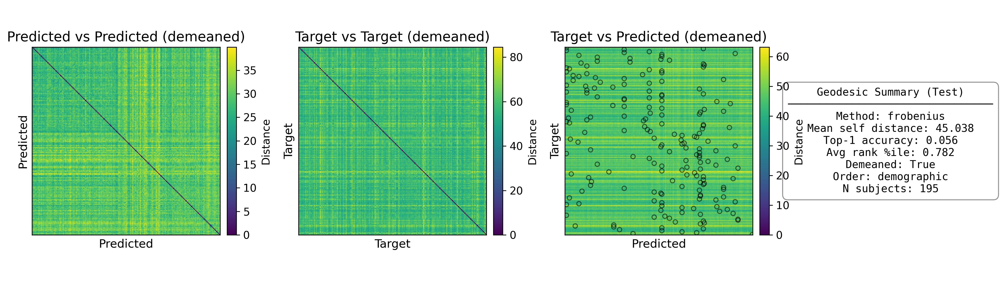


Geodesic FC distance metadata:
Partition: Test
Method: frobenius
Demeaned: True
Order: demographic
Color scale mode: per_plot
Diagonal value: 1.000
Targets projected: 0/195 (0.00%)
Predictions projected: 0/195 (0.00%)
Min target eig before projection: -2.342e+01
Min pred eig before projection: -1.030e+01
Mean clipped eig fraction (targets): 0.00%
Mean clipped eig fraction (preds): 0.00%
Mean negative eig fraction (targets): 6.15%
Mean negative eig fraction (preds): 4.37%
Mean clip mass (targets): 0.000
Mean clip mass (preds): 0.000
Mean self distance: 45.0378
Top-1 accuracy: 0.0564
Avg rank %ile: 0.7820
(array([173]), array([195]))
True


In [6]:
test_eval = run_out["evaluators"]["test"]

fig_geo, geo_metrics = test_eval.plot_geodesic_heatmaps(
    demeaned=True,
    method="frobenius", # log_euclidean, affine_invariant
    order_by="demographic",
)

spd = test_eval._get_spd_reconstructions(demeaned=False, diag_value=1.0, eps=1e-6)
tp = pairwise_fc_distance(spd["targets"], spd["preds"], method="log_euclidean")
winners = np.argmin(tp, axis=1)
print(np.unique(winners, return_counts=True))

pt = pairwise_fc_distance(spd["preds"], spd["targets"], method="log_euclidean")
print(np.allclose(tp, pt.T, atol=1e-8))  # should be True


Geodesic FC distance metadata:
Partition: Test
Method: log_euclidean
Demeaned: True
Order: original
Color scale mode: per_plot
Diagonal value: 1.000
SPD eps: 1.0e-08
Targets projected: 195/195 (100.00%)
Predictions projected: 195/195 (100.00%)
Min target eig before projection: -2.342e+01
Min pred eig before projection: -1.030e+01
Mean clipped eig fraction (targets): 6.15%
Mean clipped eig fraction (preds): 4.37%
Mean negative eig fraction (targets): 6.15%
Mean negative eig fraction (preds): 4.37%
Mean clip mass (targets): 51.741
Mean clip mass (preds): 29.398
Mean self distance: 96.2583
Top-1 accuracy: 0.0410
Avg rank %ile: 0.7214

Geodesic FC distance metadata:
Partition: Test
Method: log_euclidean
Demeaned: True
Order: original
Color scale mode: per_plot
Diagonal value: 1.000
SPD eps: 1.0e-06
Targets projected: 195/195 (100.00%)
Predictions projected: 195/195 (100.00%)
Min target eig before projection: -2.342e+01
Min pred eig before projection: -1.030e+01
Mean clipped eig fraction (

[{'eps': 1e-08,
  'top1': 0.041025641025641026,
  'avg_rank': 0.7214201183431952,
  'mean_dist': 96.25832794262163,
  'pred_proj_rate': 1.0,
  'pred_clip_frac': 0.04368945868945868,
  'pred_clip_mass': 29.398210976131697},
 {'eps': 1e-06,
  'top1': 0.041025641025641026,
  'avg_rank': 0.7277843523997369,
  'mean_dist': 73.20210896064809,
  'pred_proj_rate': 1.0,
  'pred_clip_frac': 0.04368945868945868,
  'pred_clip_mass': 29.39822654705477},
 {'eps': 0.0001,
  'top1': 0.046153846153846156,
  'avg_rank': 0.7370940170940171,
  'mean_dist': 50.51092081053408,
  'pred_proj_rate': 1.0,
  'pred_clip_frac': 0.04368945868945868,
  'pred_clip_mass': 29.399783639362465},
 {'eps': 0.01,
  'top1': 0.05641025641025641,
  'avg_rank': 0.7536357659434583,
  'mean_dist': 28.977712872754402,
  'pred_proj_rate': 1.0,
  'pred_clip_frac': 0.04405982905982905,
  'pred_clip_mass': 29.55613993533676}]

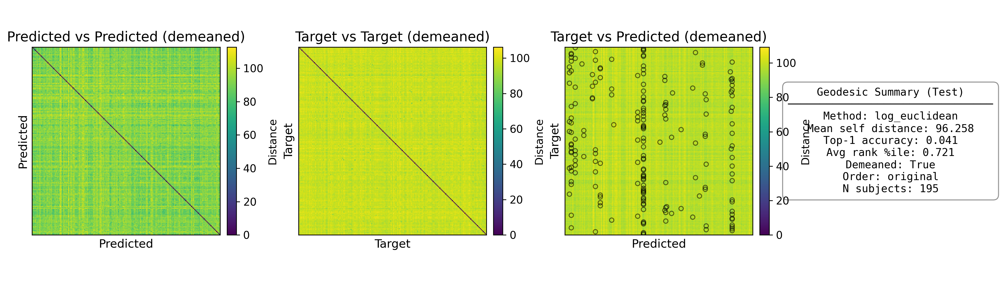

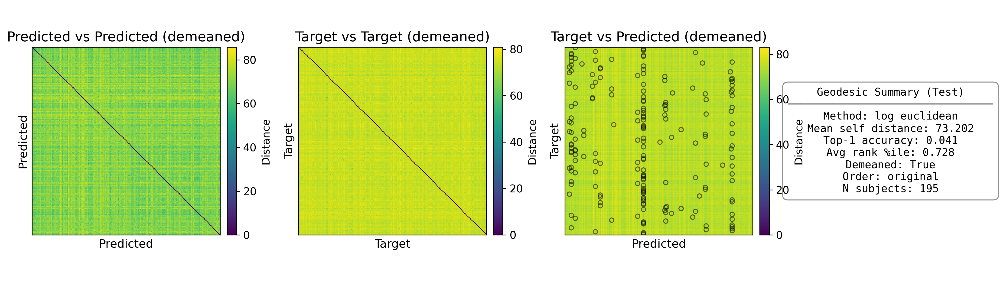

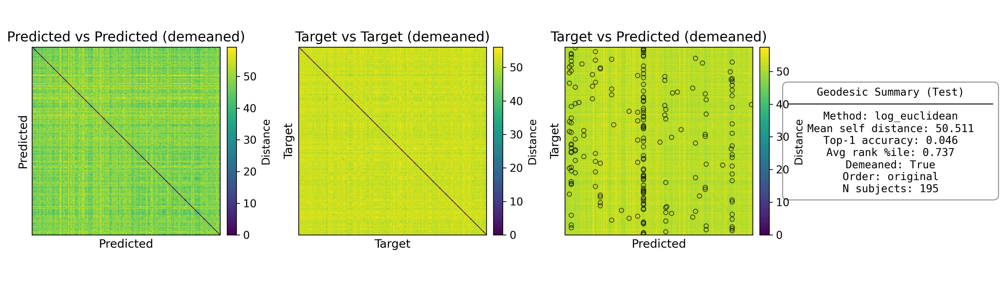

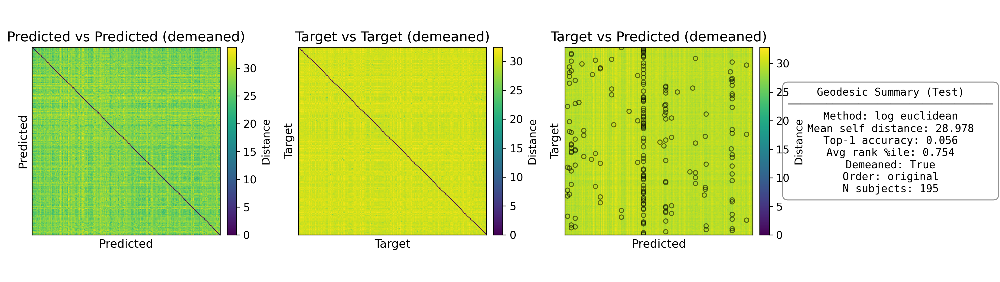

In [7]:
eps_list = [1e-8, 1e-6, 1e-4, 1e-2]
rows = []
for eps in eps_list:
    _, m = test_eval.plot_geodesic_heatmaps(
        demeaned=True,  # or False
        method="log_euclidean",
        geodesic_eps=eps,   # if calling through analyze_results use geodesic_eps
        eps=eps,            # if calling plot_geodesic_heatmaps directly
        show=False,
        print_metadata=True,
    )
    md = m["metadata"]
    rows.append({
        "eps": eps,
        "top1": m["top1_acc"],
        "avg_rank": m["avg_rank_percentile"],
        "mean_dist": m["mean_self_distance"],
        "pred_proj_rate": md["preds_fraction_projected"],
        "pred_clip_frac": md["preds_mean_clipped_fraction"],
        "pred_clip_mass": md["preds_mean_clip_mass"],
    })
rows
